In [ ]:
#Harmony Integration - Mesen

In [1]:
library(Seurat)
library(harmony)
library(ggplot2)
library(openxlsx)
library(readxl)
library(tidyr)

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.3.2 but the current version is
4.3.3; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.6.3 but the current
version is 1.6.5; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Loading required package: Rcpp



In [2]:
#Load datasets
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Subsets")
load("data_adams_mes.RData")
load("data_haber_mes.RData")
load("data_reyf_mes.RData")
load("data_rama_mes.RData")
load("data_fons_mes.RData")
load("data_kuppe_mes.RData")
load("data_panc_mes.RData")
load("data_deng_mes.RData")

In [19]:
#Clean reductions
data_panc_mesen@reductions$pca <- NULL
data_panc_mesen@reductions$harmony <- NULL
data_panc_mesen@reductions$umap.harmony <- NULL
data_kuppe_seurat_mesen@reductions$harmony <- NULL
data_kuppe_seurat_mesen@reductions$pca <- NULL
data_kuppe_seurat_mesen@reductions$umap.harmony <- NULL
data_kuppe_seurat_mesen@reductions$umap.unint <- NULL
data_adams_seurat_mesen@reductions$harmony <- NULL
data_adams_seurat_mesen@reductions$pca <- NULL
data_adams_seurat_mesen@reductions$umap.harmony <- NULL

In [20]:
data_adams_seurat_mesen@assays$RNA@layers$data <- NULL
data_adams_seurat_mesen@assays$RNA@layers$scale.data <- NULL

In [22]:
data_panc_mesen$study <- "Panc"

In [23]:
#Check number of cells in each Seurat object
print(paste("data_adams_seurat_mesen:", ncol(data_adams_seurat_mesen)))
print(paste("data_haber_seurat_mesen:", ncol(data_haber_seurat_mesen)))
print(paste("data_reyf_seurat_mesen:", ncol(data_reyf_seurat_mesen)))
print(paste("data_rama_seurat_mesen:", ncol(data_rama_seurat_mesen)))
print(paste("data_fons_mes:", ncol(data_fons_mes)))
print(paste("data_kuppe_seurat_mesen:", ncol(data_kuppe_seurat_mesen)))
print(paste("data_panc_mesen:", ncol(data_panc_mesen)))
print(paste("data_deng_mes:", ncol(data_deng_mes)))

[1] "data_adams_seurat_mesen: 13182"
[1] "data_haber_seurat_mesen: 15678"
[1] "data_reyf_seurat_mesen: 1978"
[1] "data_rama_seurat_mesen: 10244"
[1] "data_fons_mes: 227832"
[1] "data_kuppe_seurat_mesen: 60231"
[1] "data_panc_mesen: 10281"
[1] "data_deng_mes: 32255"


In [24]:
#Rename cells (merging will do this automatically)
data_adams_seurat_mesen <- RenameCells(data_adams_seurat_mesen, new.names = paste0(colnames(data_adams_seurat_mesen), "_adams"))
data_haber_seurat_mesen <- RenameCells(data_haber_seurat_mesen, new.names = paste0(colnames(data_haber_seurat_mesen), "_haber"))
data_reyf_seurat_mesen <- RenameCells(data_reyf_seurat_mesen, new.names = paste0(colnames(data_reyf_seurat_mesen), "_reyf"))
data_rama_seurat_mesen <- RenameCells(data_rama_seurat_mesen, new.names = paste0(colnames(data_rama_seurat_mesen), "_rama"))
data_fons_mes <- RenameCells(data_fons_mes, new.names = paste0(colnames(data_fons_mes), "_fons"))
data_kuppe_seurat_mesen <- RenameCells(data_kuppe_seurat_mesen, new.names = paste0(colnames(data_kuppe_seurat_mesen), "_kuppe"))
data_panc_mesen <- RenameCells(data_panc_mesen, new.names = paste0(colnames(data_panc_mesen), "_panc"))
data_deng_mes <- RenameCells(data_deng_mes, new.names = paste0(colnames(data_deng_mes), "_deng"))

In [25]:
#Merge datasets
data_merged_mesen <- merge(data_adams_seurat_mesen, c(data_haber_seurat_mesen, data_reyf_seurat_mesen,
                                         data_rama_seurat_mesen,  data_fons_mes, 
                                          data_kuppe_seurat_mesen,  data_panc_mesen, 
                                           data_deng_mes))

In [30]:
data_merged_mesen

An object of class Seurat 
75626 features across 371681 samples within 1 assay 
Active assay: RNA (75626 features, 2000 variable features)
 8 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8

In [29]:
#Clean up layers
data_merged_mesen@assays$RNA@layers$`data.4` <- NULL
data_merged_mesen@assays$RNA@layers$`data.5` <- NULL
data_merged_mesen@assays$RNA@layers$`data.6` <- NULL
data_merged_mesen@assays$RNA@layers$`data.7` <- NULL
data_merged_mesen@assays$RNA@layers$`scale.data.4`<- NULL
data_merged_mesen@assays$RNA@layers$`scale.data.5`<- NULL
data_merged_mesen@assays$RNA@layers$`scale.data.6`<- NULL
data_merged_mesen@assays$RNA@layers$`scale.data.7`<- NULL

In [32]:
#Preparation prior to integration - timed
start.time <- Sys.time()

data_merged_mesen <- NormalizeData(data_merged_mesen)


data_merged_mesen <- FindVariableFeatures(data_merged_mesen, selection.method = "vst", nfeatures = 2000)


data_merged_mesen <- ScaleData(data_merged_mesen,verbose = FALSE)

data_merged_mesen <- RunPCA(data_merged_mesen, features = VariableFeatures(object = data_merged_mesen), npcs = 50)

result <- sum(1:10000)

end.time <- Sys.time()
time.taken <- round(end.time - start.time,2)
time.taken

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Normalizing layer: counts.5

Normalizing layer: counts.6

Normalizing layer: counts.7

Normalizing layer: counts.8

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Finding variable features for layer counts.5

Finding variable features for layer counts.6

Finding variable features for layer counts.7

Finding variable features for layer counts.8

PC_ 1 
Positive:  DCN, COL1A2, COL1A1, LUM, COL3A1, COL6A2, SERPINF1, FBLN1, C1R, C1S 
	   LGALS1, PCOLCE, COL6A1, COL6A3, CCDC80, MMP2, AEBP1, RARRES2, COL14A1, CFD 
	   CTSK, LRP1, MFAP4, MXRA8, IGFBP6, OLFML3, MEG3, SPON2, C3, VCAN 
Negative:  CD74, PECAM1, EGFL7, RNASE1, HLA-DRB1, HLA-DRA, IFI27, PTPRB, FLT1, RAMP2 
	   PLVAP, EMCN, RAMP3, ADGRL4, HLA-DPA1, CD93, GIMAP7, EPAS1, TM4SF1, CAVIN2 

Time difference of 9.89 mins

In [33]:
data_merged_mesen$study <- as.factor(data_merged_mesen$study) #confounder needs to be factor

In [34]:
unique(data_merged_mesen$study) 

[1] Adams        Habermann    Reyfman      Ramachandran Fonseca     
[6] Kuppe        Panc         Deng        
Levels: Adams Deng Fonseca Habermann Kuppe Panc Ramachandran Reyfman

In [35]:
#Harmony integration - timed
start.time <- Sys.time()


data_merged_mesen <- RunHarmony(data_merged_mesen, 
                        group.by.vars = "study",
                        reduction = "pca",
                        verbose = TRUE,
                        reduction.save = "harmony",
                        assay.use = "RNA")

result <- sum(1:10000)

end.time <- Sys.time()
time.taken <- round(end.time - start.time,2)
time.taken

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 18584050)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 18584050)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 18584050)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 18584050)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony converged after 7 iterations



Time difference of 9.9 mins

In [36]:
data_merged_mesen <- FindNeighbors(data_merged_mesen, dims = 1:20, reduction = "harmony")
data_merged_mesen <- FindClusters(data_merged_mesen, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 371681
Number of edges: 10514924

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9406
Number of communities: 36
Elapsed time: 258 seconds


1 singletons identified. 35 final clusters.



In [37]:
data_merged_mesen <- RunUMAP(data_merged_mesen, reduction = "harmony", dims = 1:20, reduction.name = "umap.harmony")

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
15:53:16 UMAP embedding parameters a = 0.9922 b = 1.112

15:53:16 Read 371681 rows and found 20 numeric columns

15:53:16 Using Annoy for neighbor search, n_neighbors = 30

15:53:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:53:59 Writing NN index file to temp file /tmp/RtmppHPRxo/file117f26689b8f93

15:53:59 Searching Annoy index using 1 thread, search_k = 3000

15:56:45 Annoy recall = 100%

15:56:46 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbo

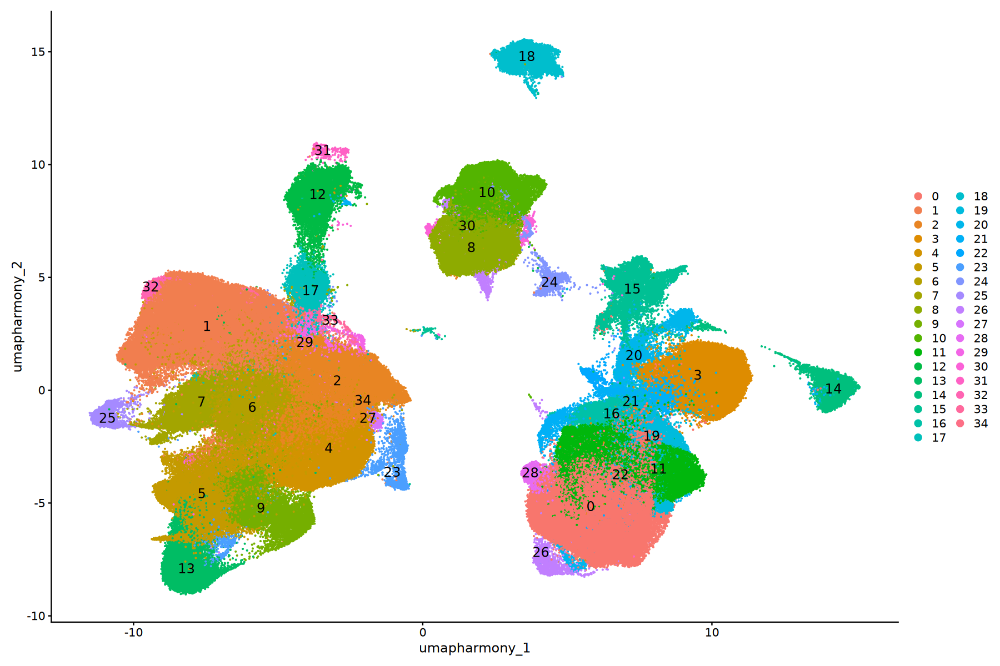

In [38]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(data_merged_mesen, reduction = "umap.harmony", label = TRUE, pt.size = 0.1, label.size = 5, raster = FALSE)

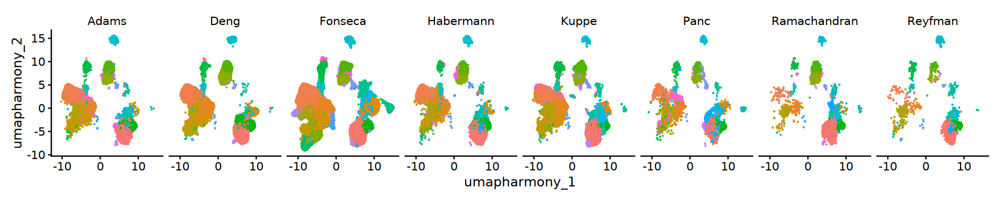

In [39]:
options(repr.plot.width=15, repr.plot.height=3)
DimPlot(data_merged_mesen, reduction = "umap.harmony", split.by = "study", label = FALSE, pt.size = 0.1, label.size = 5, raster = FALSE) + NoLegend()

In [41]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
p <- DimPlot(data_merged_mesen, reduction = "umap.harmony", split.by = "study", label = FALSE, pt.size = 0.1, label.size = 5, raster = FALSE) + NoLegend()
ggsave("data_merged_UMAP_studysplit.pdf", plot = p, width = 15, height = 3)

In [ ]:
#This part aims at annotating the clusters

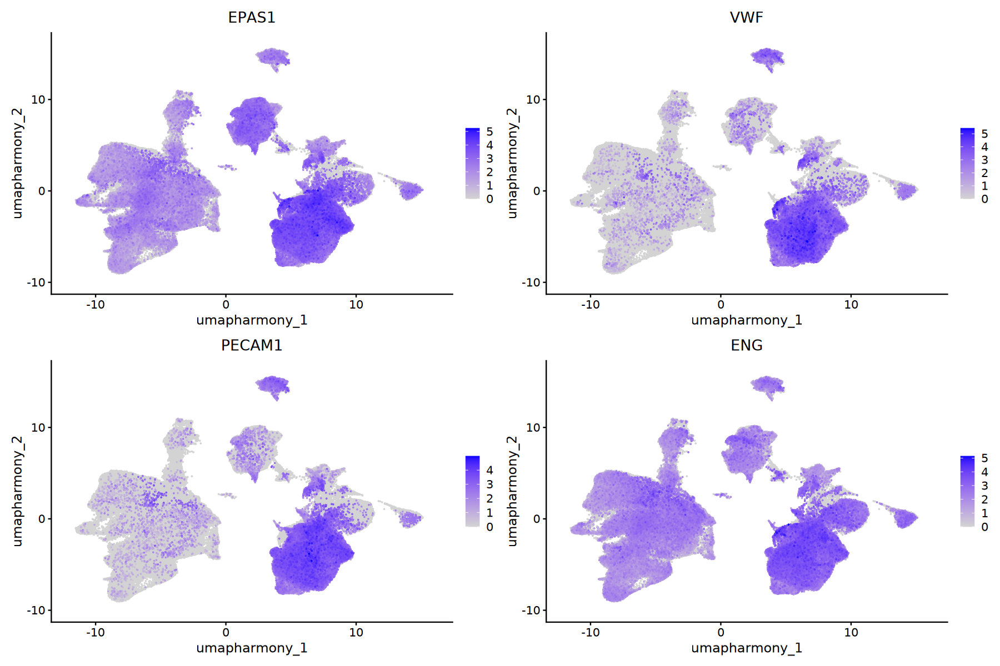

In [42]:
##Annotation of cells - Endothelial
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("EPAS1", "VWF", "PECAM1", "ENG"), raster = FALSE, order = TRUE) 

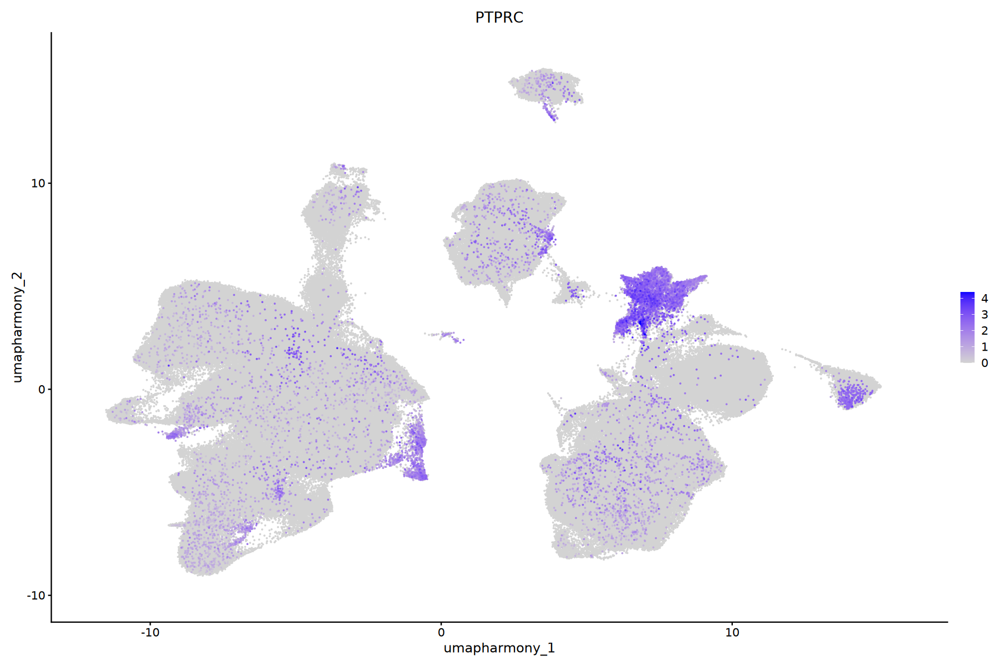

In [44]:
#Annotation of cells - Immune (Not supposed to be here, what's next? Check quality of cluster and other marker genes).
#If the cluster is deemed "noise", it will be removed. 
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("PTPRC"), raster = FALSE, order = TRUE) 

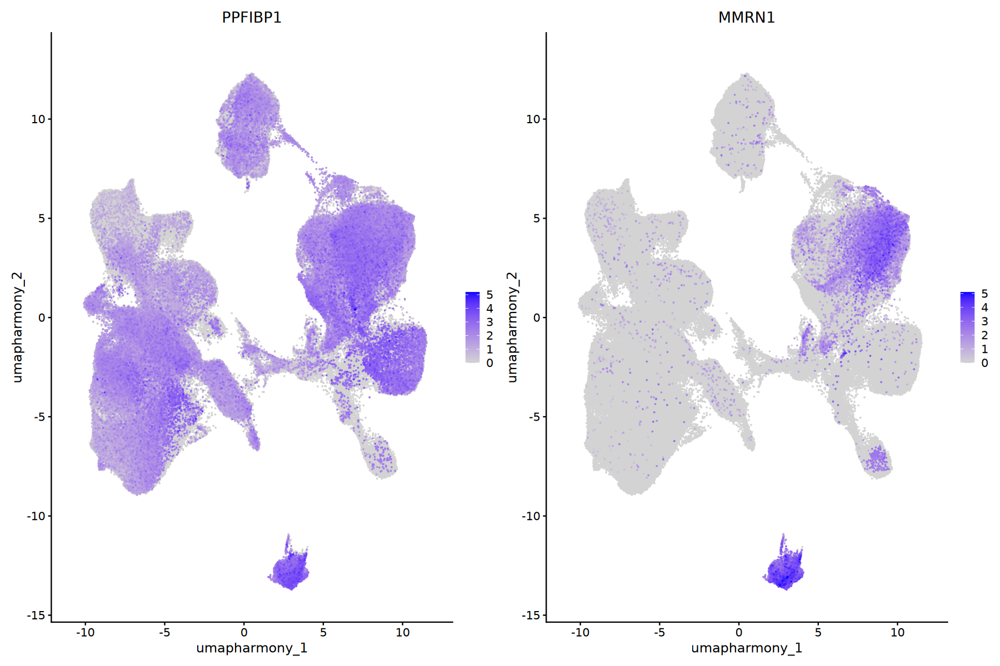

In [90]:
#Annotation of cells - Lymph endo cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("PPFIBP1", "MMRN1"), raster = FALSE, order = TRUE) 

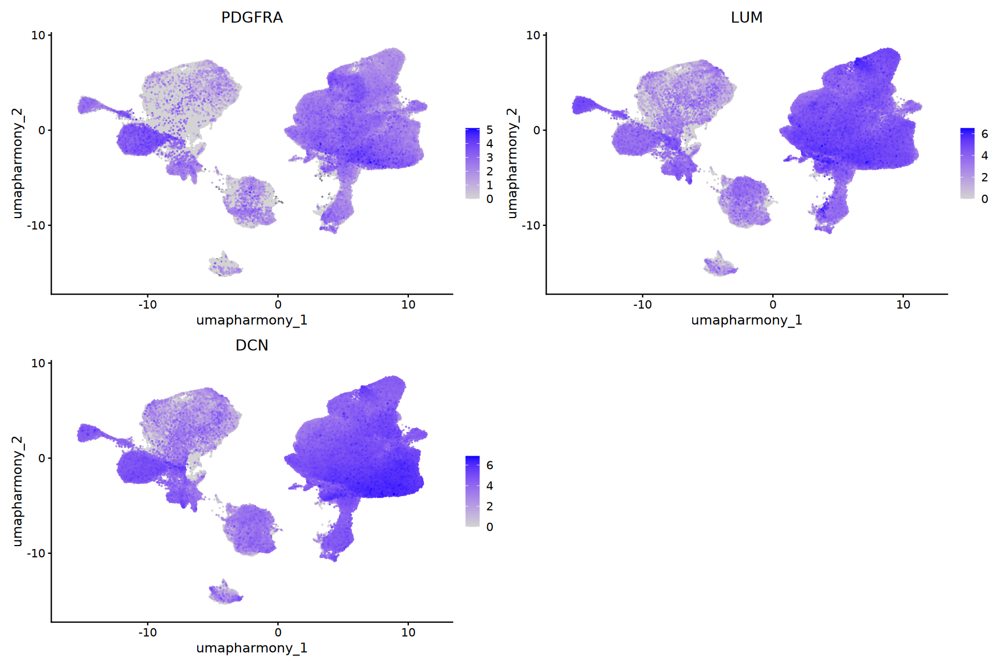

In [27]:
#Annotation of cells - Fibroblasts
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("PDGFRA", "LUM", "DCN"), raster = FALSE, order = TRUE) 

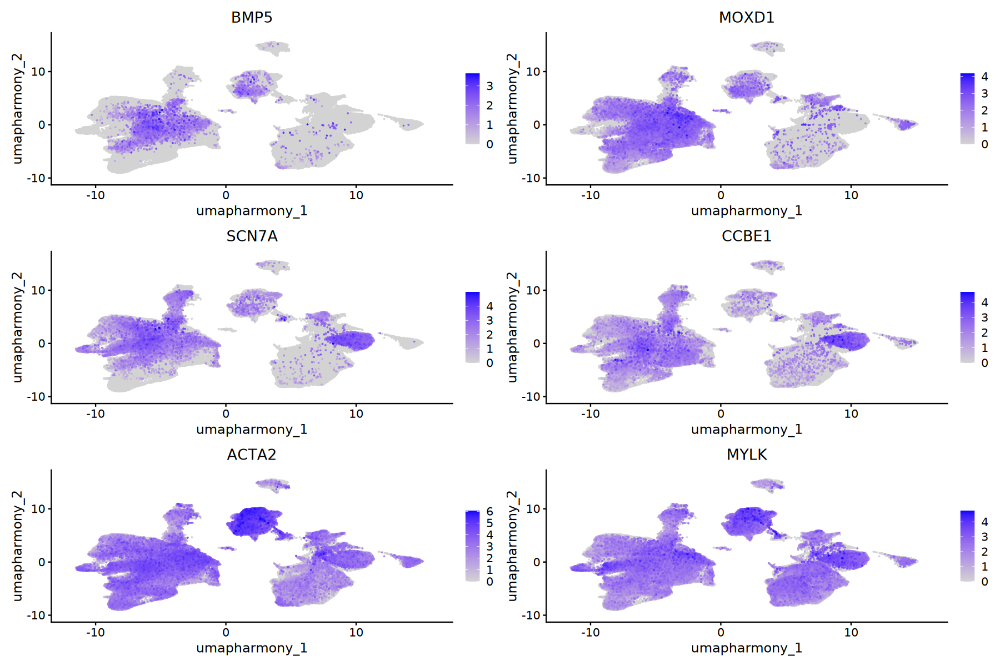

In [45]:
#Annotating - Myofibroblasts
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("BMP5", "MOXD1", "SCN7A", "CCBE1", "ACTA2", "MYLK"), raster = FALSE, order = TRUE) 

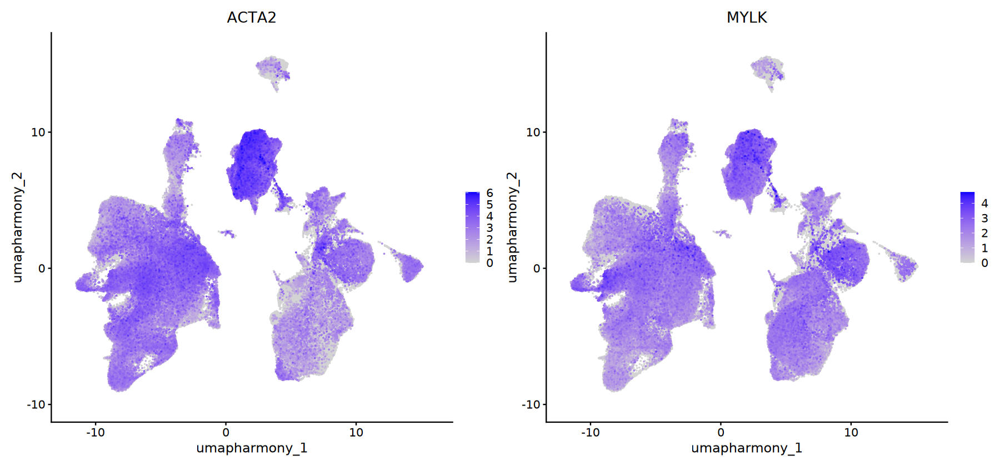

In [46]:
#Annotating - Myofibroblasts
options(repr.plot.width=15, repr.plot.height=7)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("ACTA2", "MYLK"), raster = FALSE, order = TRUE) 

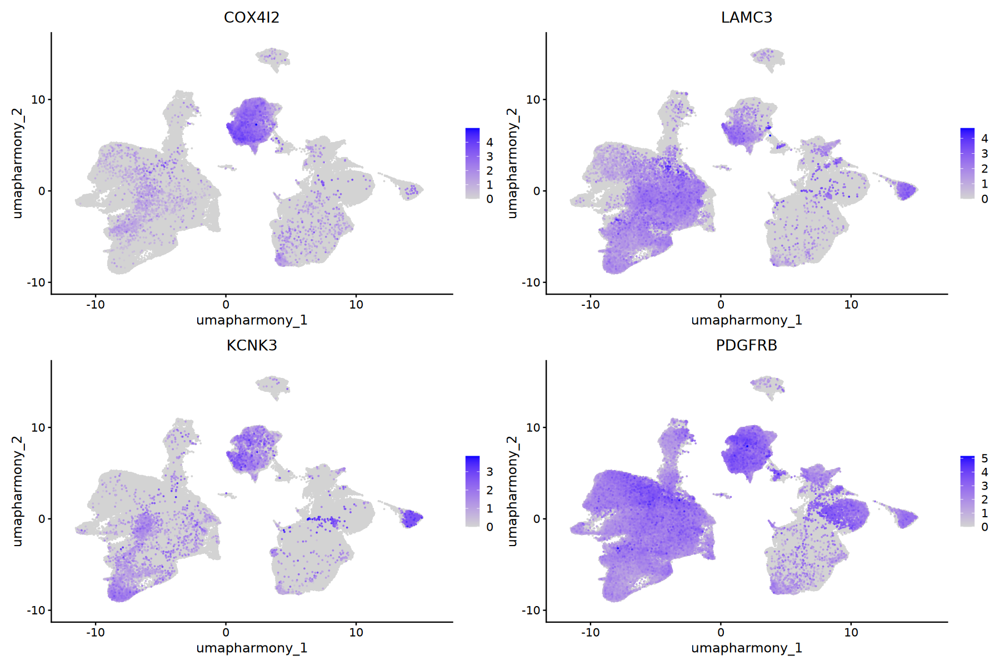

In [47]:
#Annotating - Pericytes
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("COX4I2", "LAMC3", "KCNK3", "PDGFRB"), raster = FALSE, order = TRUE) 

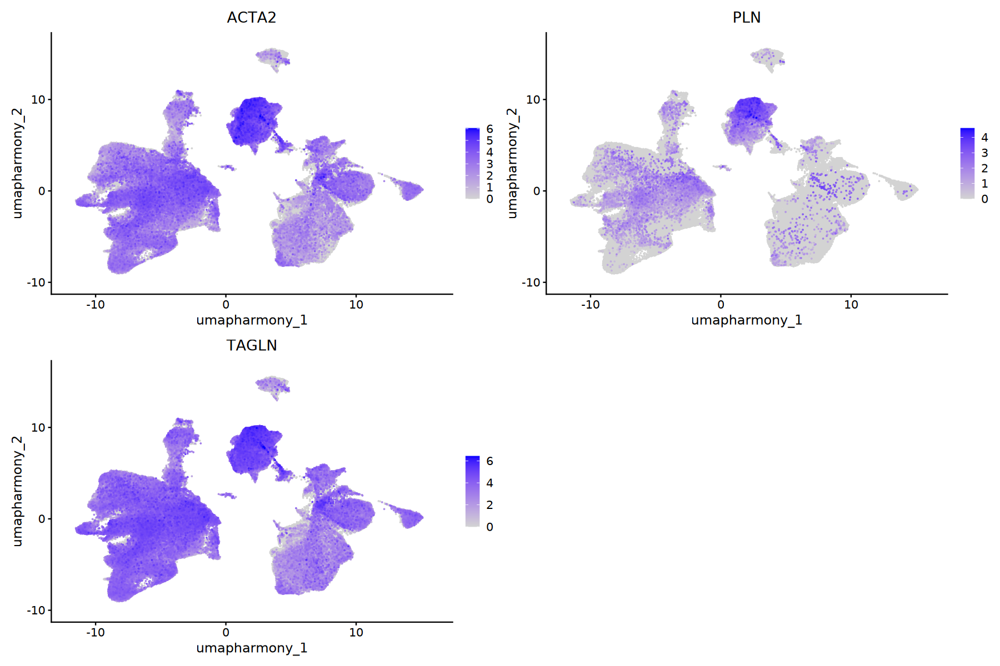

In [48]:
#Annotation of cells - SMCs
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("ACTA2", "PLN", "TAGLN"), raster = FALSE, order = TRUE) 

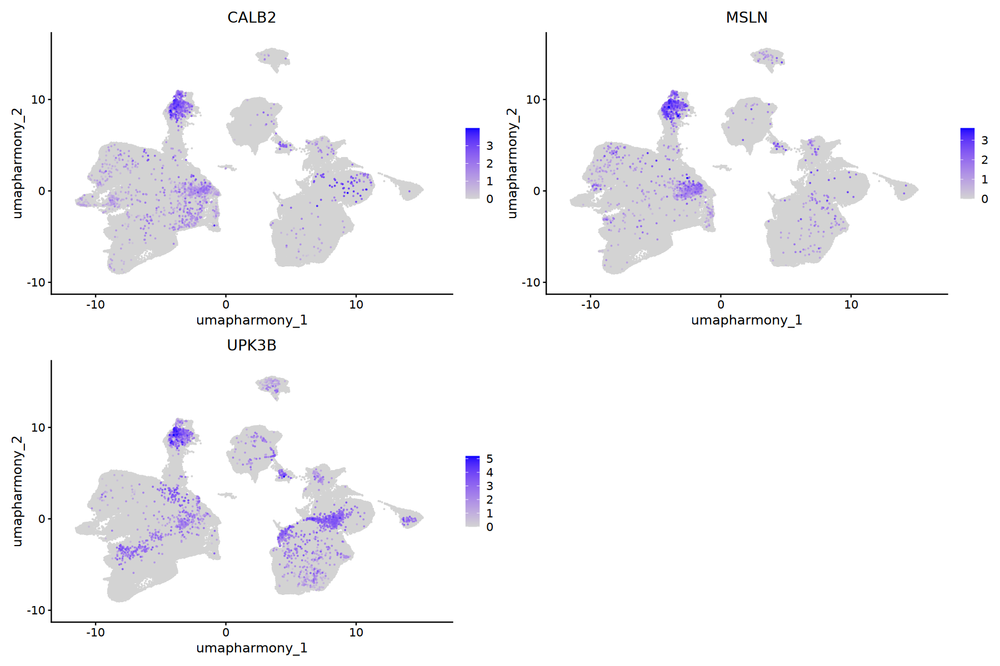

In [49]:
#Annotating - Mesothelial cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("CALB2", "MSLN", "UPK3B"), raster = FALSE, order =TRUE) #Mesothelial cells

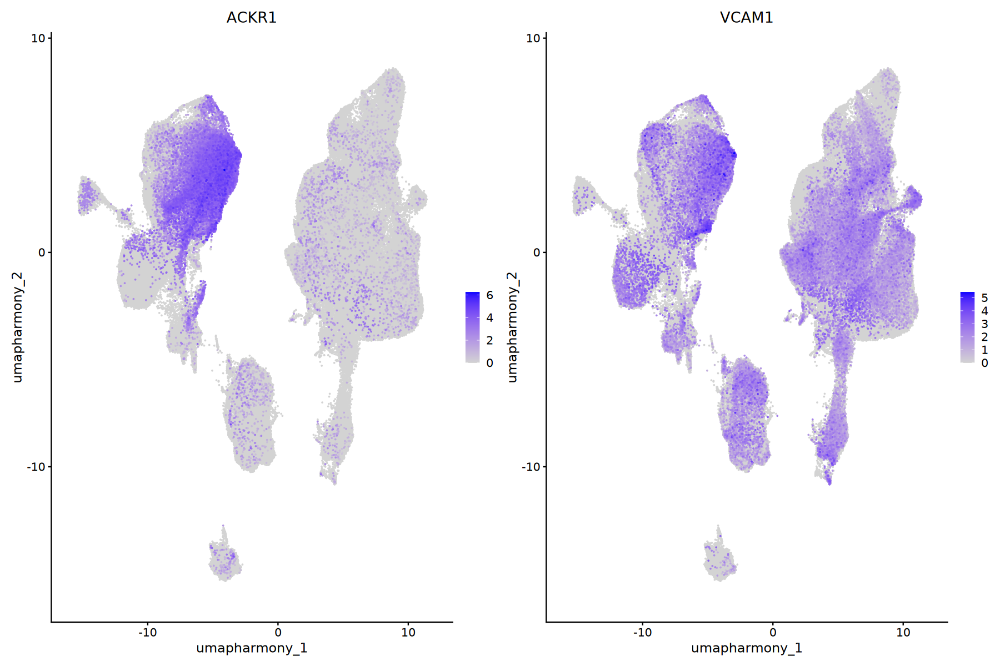

In [35]:
#Annotating - Injured Endothelial cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("ACKR1", "VCAM1"), raster = FALSE, order =TRUE) 

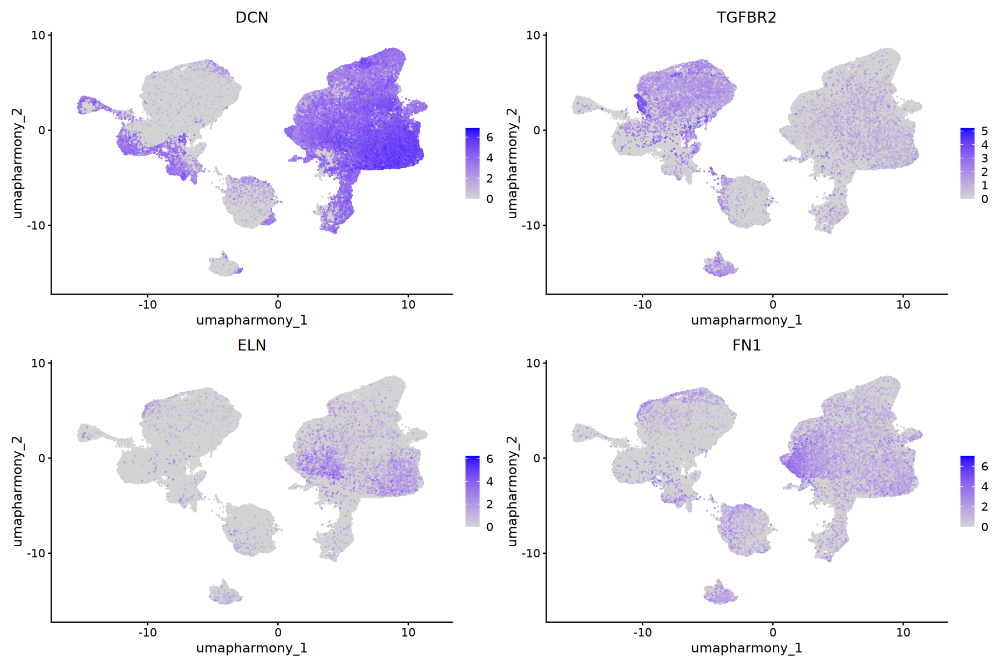

In [38]:
#Annotating - Injured Endothelial cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("DCN", "TGFBR2", "ELN", "FN1"), raster = FALSE, order =FALSE) 

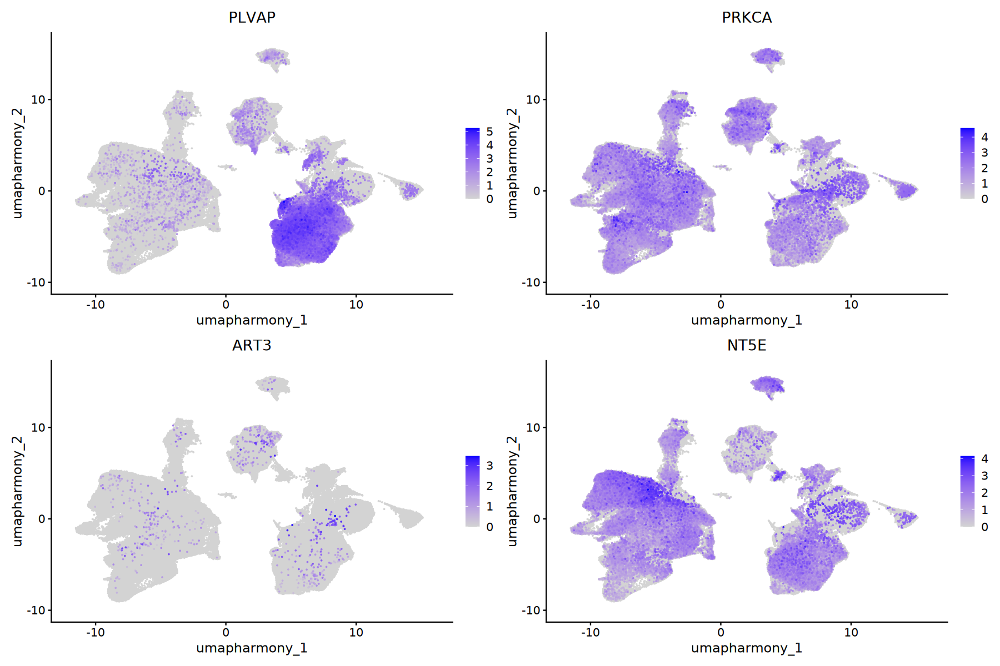

In [50]:
#Annotating-Mesangial
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("PLVAP", "PRKCA", "ART3", "NT5E"), raster = FALSE, order = TRUE) 

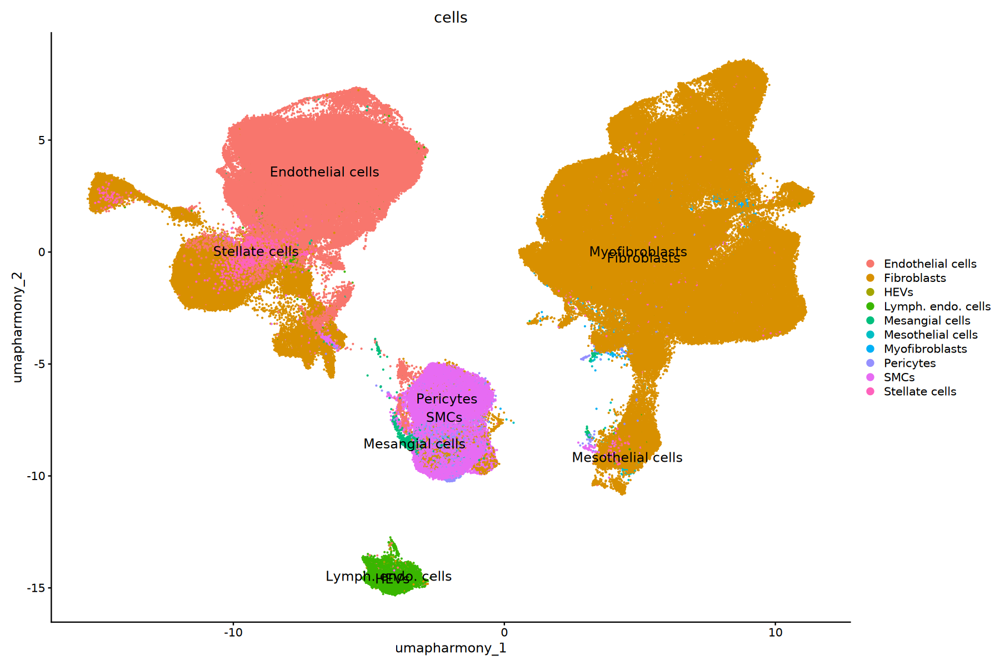

In [25]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(data_merged_mesen, reduction = "umap.harmony", group.by = "cells", label = TRUE, pt.size = 0.1, label.size = 5, raster = FALSE)

In [13]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
save(data_merged_mesen, file = "data_merged_mesen_umap.RData")

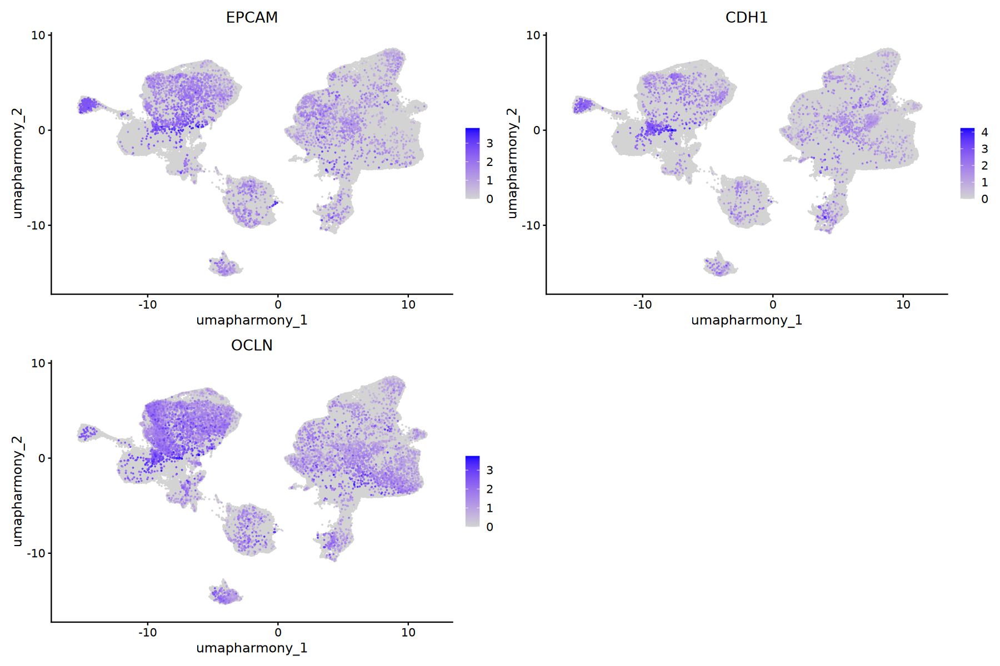

In [12]:
#Annotating-Mesangial
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("EPCAM", "CDH1", "OCLN"), raster = FALSE, order = TRUE) 

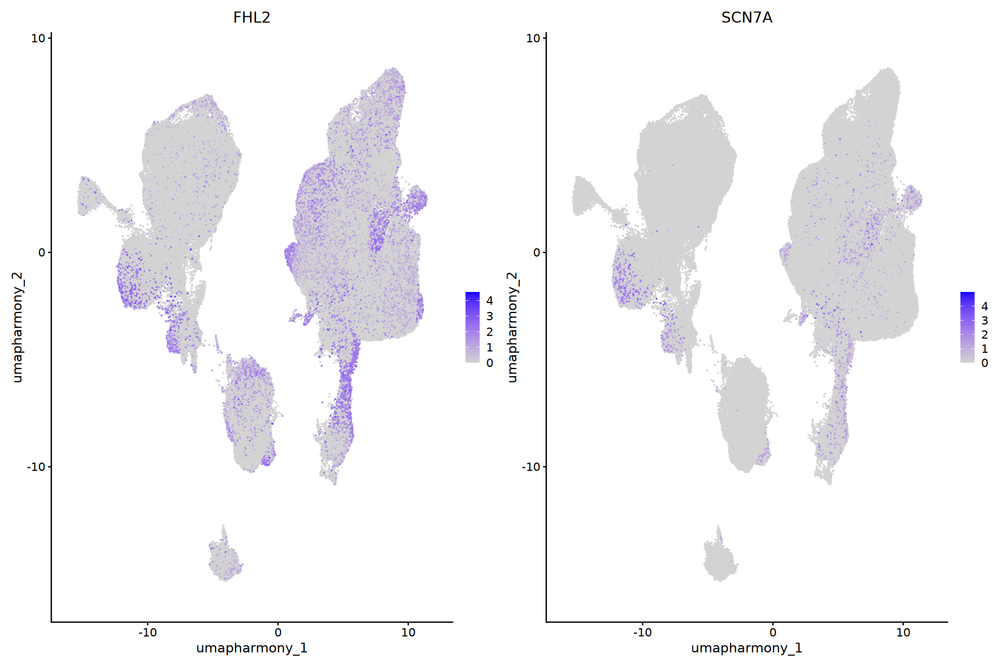

In [117]:
#Annotating-Mesangial
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("FHL2", "SCN7A"), raster = FALSE, order = FALSE) 

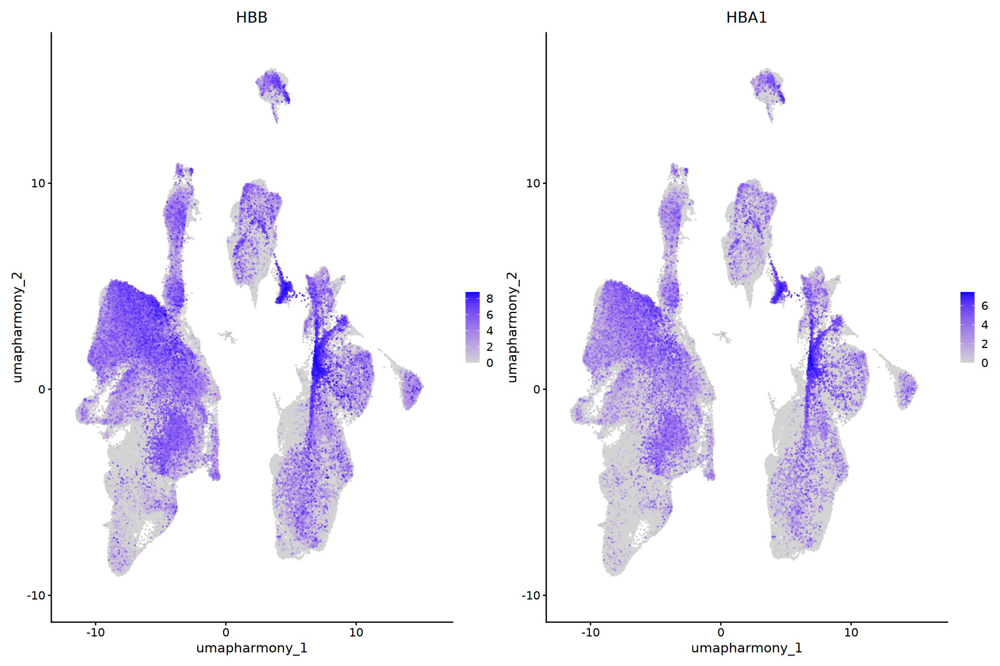

In [56]:
#Annotating-Erythro
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_merged_mesen, reduction = "umap.harmony", features = c("HBB", "HBA1"), raster = FALSE, order = TRUE) 

In [52]:
data_merged_mesen <- JoinLayers(data_merged_mesen)

In [9]:
data_merged_mesen

An object of class Seurat 
75626 features across 371681 samples within 1 assay 
Active assay: RNA (75626 features, 2000 variable features)
 4 layers present: data, counts, scale.data.5, scale.data
 3 dimensional reductions calculated: pca, harmony, umap.harmony

In [54]:
#Markers of 24
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls24 <- FindMarkers(data_merged_mesen, ident.1 = 24, ident.2 = c(10, 30, 8),logfc.threshold = 1)
cls24$genes <- rownames(cls24)
write.xlsx(cls24, "data_merged_mesen_cluster24.xlsx") 

In [58]:
#Markers of 17
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls17 <- FindMarkers(data_merged_mesen, ident.1 = 17, ident.2 = c(1,6, 7, 4),logfc.threshold = 1)
cls17$genes <- rownames(cls17)
write.xlsx(cls17, "data_merged_mesen_cluster17.xlsx") 

In [57]:
#Markers of 25
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls25 <- FindMarkers(data_merged_mesen, ident.1 = 25, ident.2 = c(6, 7, 4),logfc.threshold = 1)
cls25$genes <- rownames(cls25)
write.xlsx(cls25, "data_merged_mesen_cluster25.xlsx") 

In [13]:
#Markers of 15
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls15 <- FindMarkers(data_merged_mesen, ident.1 = 15, ident.2 = c(0, 21, 22, 11, 23, 14, 24), logfc.threshold = 1)
cls15$genes <- rownames(cls15)
write.xlsx(cls15, "data_merged_mesen_cluster15.xlsx") 

In [64]:
#Markers of 26
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls26 <- FindMarkers(data_merged_mesen, ident.1 = 26, ident.2 = c(1, 7, 25, 6, 2), logfc.threshold = 1)
cls26$genes <- rownames(cls26)
write.xlsx(cls26, "data_merged_mesen_cluster26.xlsx") 

In [1]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
load("data_merged_mesen_ann.RData")

In [5]:
data_merged_mesen <- JoinLayers(data_merged_mesen)

In [ ]:
#Markers of 15
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls15 <- FindMarkers(data_merged_mesen, ident.1 = 15, ident.2 = c(0, 21, 22, 11, 23, 14, 24), logfc.threshold = 1)
cls15$genes <- rownames(cls15)
write.xlsx(cls15, "data_merged_mesen_cluster15.xlsx") 

In [6]:
#Markers of 19
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls19 <- FindMarkers(data_merged_mesen, ident.1 = 19, ident.2 = c(0, 21, 22, 11, 23, 14, 24), logfc.threshold = 1)
cls19$genes <- rownames(cls19)
write.xlsx(cls19, "data_merged_mesen_cluster19.xlsx") 

In [7]:
#Markers of 3
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls3 <- FindMarkers(data_merged_mesen, ident.1 = 3, ident.2 = c(0, 21, 22, 11, 23, 14, 24), logfc.threshold = 1)
cls3$genes <- rownames(cls3)
write.xlsx(cls3, "data_merged_mesen_cluster3.xlsx") 

In [8]:
#Markers of 16
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls16 <- FindMarkers(data_merged_mesen, ident.1 = 16, ident.2 = c(0, 21, 22, 11, 23, 14, 24), logfc.threshold = 1)
cls16$genes <- rownames(cls16)
write.xlsx(cls16, "data_merged_mesen_cluster16.xlsx") 

In [110]:
#Markers of 12
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
library(future)
plan("multicore", workers = 6)
cls12<- FindMarkers(data_merged_mesen, ident.1 = "Mesothelial cells", logfc.threshold = 1)
cls12$genes <- rownames(cls12)
write.xlsx(cls12, "data_merged_mesen_cluster12.xlsx") 

In [ ]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")

In [54]:
contingency_table$source <- factor(contingency_table$source, levels = 0:29)

In [ ]:
#Sankey diagram
library(networkD3)
contingency_table <- table(data_merged_mesen$`RNA_snn_res.0.5`, data_merged_mesen$study)
contingency_table <- as.data.frame.matrix(contingency_table)
contingency_table$source <- rownames(contingency_table)
rownames(contingency_table) <- NULL
contingency_table$source <- factor(contingency_table$source, levels = sort(unique(contingency_table$source)))
library(reshape2)  # Make sure the reshape2 package is installed
contingency_table_long <- melt(contingency_table, id.vars = "source", variable.name = "target", value.name = "value")
nodes <- unique(c(as.character(contingency_table_long$source), as.character(contingency_table_long$target)))
nodes_df <- data.frame(name = nodes)
contingency_table_long$sourceID <- match(contingency_table_long$source, nodes_df$name) - 1
contingency_table_long$targetID <- match(contingency_table_long$target, nodes_df$name) - 1
contingency_table_long <- contingency_table_long[contingency_table_long$value > 10, ] 
sankey <- sankeyNetwork(Links = contingency_table_long, Nodes = nodes_df, Source = "sourceID", Target = "targetID", 
                        Value = "value", NodeID = "name", 
                        sinksRight=FALSE, nodeWidth=100, fontSize=13, nodePadding=10)
sankey

In [62]:
contingency_table_long$source <- factor(contingency_table_long$source, levels = 0:34)

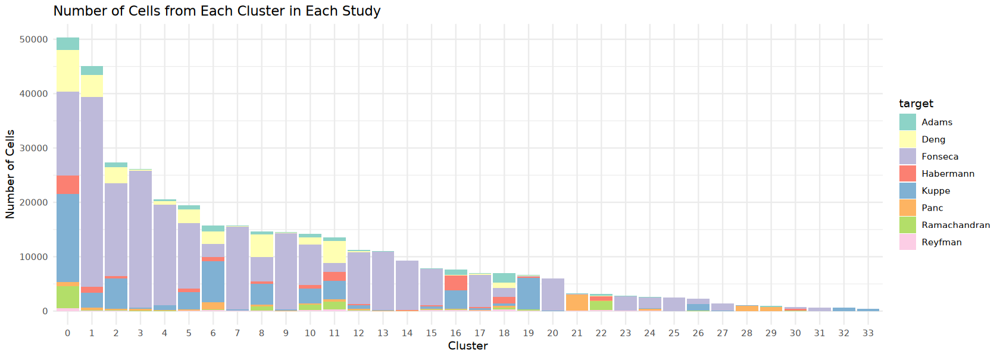

In [63]:
options(repr.plot.width=14, repr.plot.height=5)
ggplot(contingency_table_long, aes(x = source, y = value, fill = target)) +
  geom_bar(stat = "identity") +
  labs(title = "Number of Cells from Each Cluster in Each Study",
       x = "Cluster",
       y = "Number of Cells") +
  theme_minimal() +
  scale_fill_brewer(palette = "Set3")

In [64]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
p <- ggplot(contingency_table_long, aes(x = source, y = value, fill = target)) +
  geom_bar(stat = "identity") +
  labs(title = "Number of Cells from Each Cluster in Each Study",
       x = "Cluster",
       y = "Number of Cells") +
  theme_minimal() +
  scale_fill_brewer(palette = "Set3")
ggsave("data_merged_mesen_barplot_cluster_distribution.pdf", plot = p, width = 15, height = 5)

In [ ]:
#Rearrange cells order
#Check the current levels of cell_identity
levels(data_merged_mesen$`RNA_snn_res.0.5`)

# Define the desired order of factor levels
desired_order <- c("0", "1", "2", "3", "4", "5", "6", "7",
                   "8", "9", "10", "11", "12", "13", "14",
                   "15", "16", "17", "18",  "19", "20", "21", "22", "23", "24", "25",  "26", "27", "28", "29", "30", "31", "32", "33", "34")

# Reorder the factor levels
data_merged_mesen$`RNA_snn_res.0.5` <- factor(data_merged_mesen$`RNA_snn_res.0.5`, levels = desired_order)

# Check if the factor levels have been reordered
levels(data_merged_mesen$`RNA_snn_res.0.5`)

Warning message:
“Cannot find identity NA”
Warning message:
“Cannot find identity NA”
Warning message:
“Cannot find identity NA”
Warning message:
“Cannot find identity NA”
Warning message:
“Cannot find identity NA”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



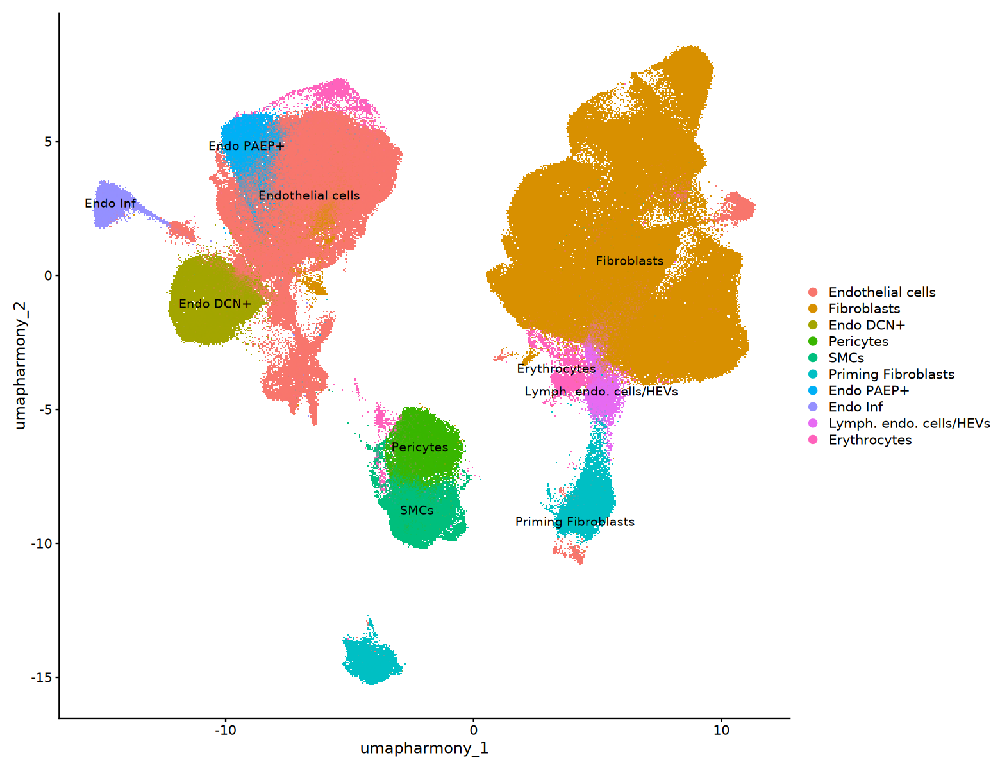

In [15]:
#Assigning new names
data_merged_mesen$cells <- NULL
data_merged_mesen@active.ident <- factor(data_merged_mesen$`RNA_snn_res.0.5`)

cluster.ids.new <- c("Endothelial cells", "Fibroblasts", "Fibroblasts", "Endo DCN+", "Fibroblasts",
                     "Fibroblasts", "Fibroblasts", "Fibroblasts", "Pericytes", "Fibroblasts", "SMCs",
                     "Endothelial cells", "Priming Fibroblasts", "Fibroblasts", "Endo PAEP+", "Endo Inf",
                     "Endothelial cells", "Priming Fibroblasts", "Lymph. endo. cells/HEVs", 
                     "Endothelial cells", "Erythrocytes", "Endothelial cells", "Endothelial cells", 
                     "Fibroblasts", "Erythrocytes", "Fibroblasts", "Endothelial cells", "Fibroblasts",
                     "Endothelial cells", "Fibroblasts", "Pericytes", "Fibro CLDN1+", "Fibroblasts", 
                     "Fibroblasts", "Fibroblasts"
)

names(cluster.ids.new) <- levels(data_merged_mesen)
data_merged_mesen <- RenameIdents(data_merged_mesen, cluster.ids.new)
options(repr.plot.width=13, repr.plot.height=10)
DimPlot(data_merged_mesen, reduction = "umap.harmony", label = TRUE)
data_merged_mesen$cells <- data_merged_mesen@active.ident

In [67]:
#Rearrange cells order
#Check the current levels of cell_identity
levels(data_merged_mesen$cells)

# Define the desired order of factor levels
desired_order <- c("Endothelial cells", "Endo Inf", "Endo DCN+", "Endo PAEP+", "Fibroblasts", "Fibro CLDN1+", "Priming Fibroblasts", "Lymph. endo. cells/HEVs"
                   , "SMCs", "Pericytes", "Erythrocytes")

# Reorder the factor levels
data_merged_mesen$cells <- factor(data_merged_mesen$cells, levels = desired_order)

# Check if the factor levels have been reordered
levels(data_merged_mesen$cells)

[1] "Endothelial cells"       "Fibroblasts"            
 [3] "Endo DCN+"               "Pericytes"              
 [5] "SMCs"                    "Priming Fibroblasts"    
 [7] "Endo PAEP+"              "Endo Inf"               
 [9] "Lymph. endo. cells/HEVs" "Erythrocytes"           
[11] "Fibro CLDN1+"

[1] "Endothelial cells"       "Endo Inf"               
 [3] "Endo DCN+"               "Endo PAEP+"             
 [5] "Fibroblasts"             "Fibro CLDN1+"           
 [7] "Priming Fibroblasts"     "Lymph. endo. cells/HEVs"
 [9] "SMCs"                    "Pericytes"              
[11] "Erythrocytes"

In [2]:
cellytpe_colors <- c(
    "Endothelial cells" = "#f9c7be",
    "Endo Inf" = "#fff0db",
    "Endo DCN+" = "#e4d5b7",
    "Endo PAEP+" = "#d9b99b",
  "Fibroblasts" = "#e65c6f",
    "Fibro CLDN1+" = "#cb5382",
    "Priming Fibroblasts" = "#fdaaaa",
  "Lymph. endo. cells/HEVs" = "#f98d77",
     "SMCs" = "#bd4545",
      "Pericytes" = "#acc4b2",
    "Erythrocytes" = "#a50727"

)

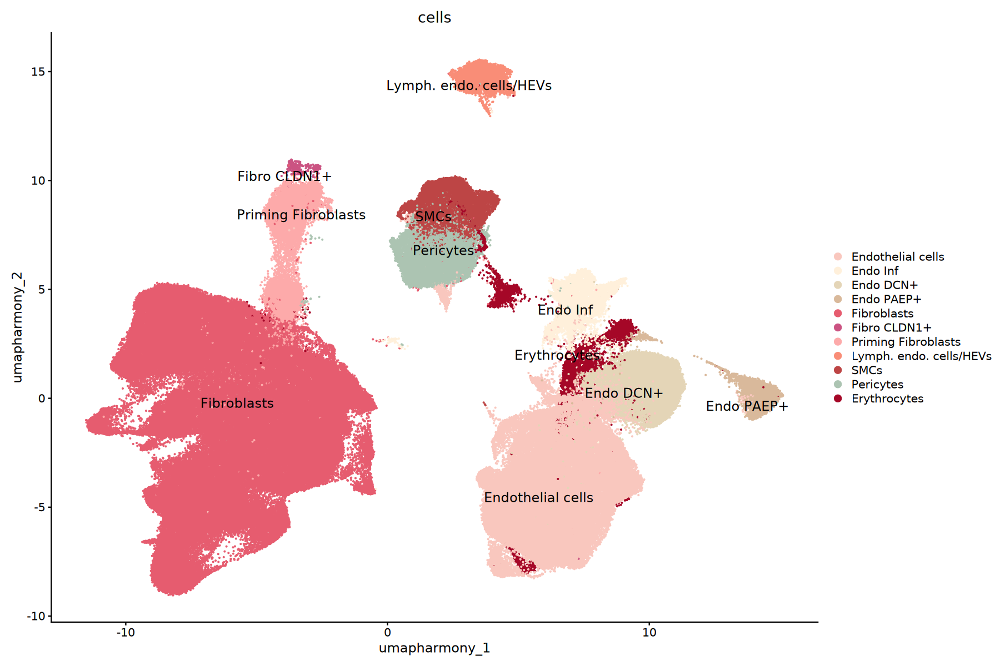

In [69]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(data_merged_mesen, reduction = "umap.harmony", cols = cellytpe_colors,  label = TRUE, repel = TRUE, group.by = "cells",pt.size = 0.1, label.size = 5, raster = FALSE)

In [70]:
unique(data_merged_mesen$cells)

[1] Lymph. endo. cells/HEVs Fibroblasts             Endothelial cells      
 [4] Priming Fibroblasts     SMCs                    Endo Inf               
 [7] Erythrocytes            Endo DCN+               Pericytes              
[10] Endo PAEP+              Fibro CLDN1+           
11 Levels: Endothelial cells Endo Inf Endo DCN+ Endo PAEP+ ... Erythrocytes

In [78]:
data_merged_mesen$cells <- as.factor(data_merged_mesen$cells)

In [87]:
data_merged_mesen@active.ident <- as.factor(data_merged_mesen$cells)
data_merged_mesen_subset <- subset(data_merged_mesen, idents = c("Endothelial cells", "Pericytes", "SMCs",
                                                                 "Lymph. endo. cells/HEVs", "Fibroblasts", "Priming Fibroblasts", "Fibro CLDN1+"))

In [89]:
data_merged_mesen@active.ident <- as.factor(data_merged_mesen$cells)
test <- subset(data_merged_mesen, subset = cells %in% c("Endothelial cells", "Pericytes", "SMCs",
                                                                 "Lymph. endo. cells/HEVs", "Fibroblasts", "Priming Fibroblasts", "Fibro CLDN1+"))

Warning message:
“Removing 51575 cells missing data for vars requested”


In [ ]:
data_merged_mesen_subset@assays$RNA@cells

Warning message:
“Removing 50585 cells missing data for vars requested”


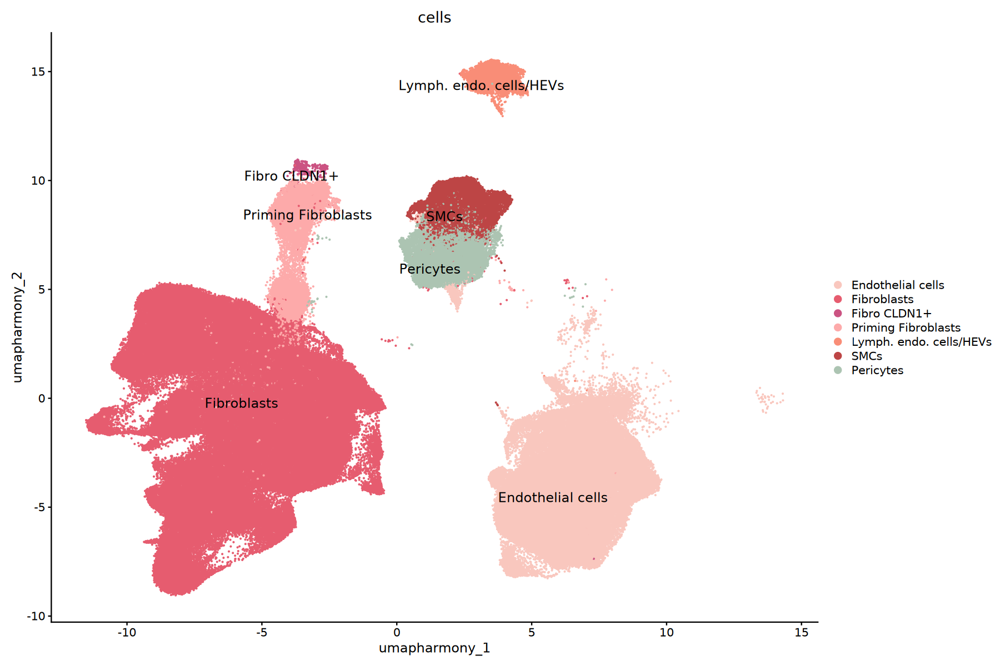

In [92]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(test, reduction = "umap.harmony", cols = cellytpe_colors,  label = TRUE, repel = TRUE, group.by = "cells",pt.size = 0.1, label.size = 5, raster = FALSE)

In [98]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
p <- DimPlot(data_merged_mesen_subset, reduction = "umap.harmony", cols = cellytpe_colors,  label = TRUE, repel = TRUE, group.by = "cells",pt.size = 0.1, label.size = 6, raster = FALSE)
ggsave("data_merged_mesen_umap_cellytpe.pdf", plot = p, width = 13, height = 10)

Warning message:
“Removing 50585 cells missing data for vars requested”


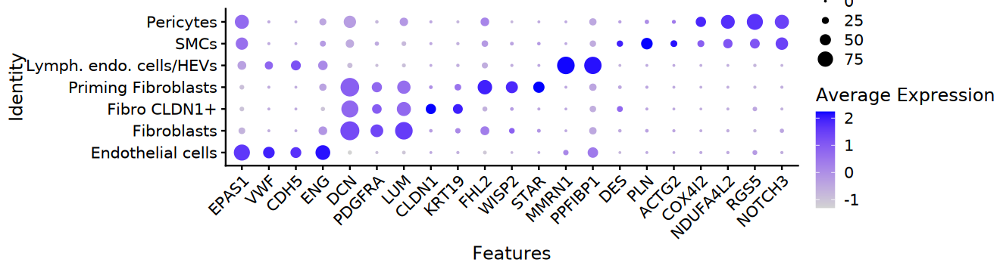

In [91]:
#Dotplotting
data_merged_mesen_subset@active.ident <- factor(data_merged_mesen_subset$cells)
data_merged_mesen_subset$cells <- factor(data_merged_mesen_subset$cells, levels = c( "Endothelial cells", 
                                                            "Fibroblasts", "Fibro CLDN1+","Priming Fibroblasts", "Lymph. endo. cells/HEVs"
                                                           , "SMCs", "Pericytes"))
data_merged_mesen_subset@active.ident <- data_merged_mesen_subset$cells

features <- c( "EPAS1", "VWF", "CDH5", "ENG", 
              "DCN", "PDGFRA", "LUM", "CLDN1", "KRT19", "FHL2", "WISP2", "STAR", "MMRN1", "PPFIBP1",
              "DES", "PLN", "ACTG2", "COX4I2", "NDUFA4L2", "RGS5", "NOTCH3"
             ) 
options(repr.plot.width=11, repr.plot.height=3)
DotPlot(data_merged_mesen_subset, features = features, group.by = "cells") + RotatedAxis()

In [ ]:
unique(data_merged_mesen$cells)

In [32]:
#Dotplotting
data_merged_mesen@active.ident <- factor(data_merged_mesen$cells)
data_merged_mesen$cells <- factor(data_merged_mesen$cells, levels = c( "Endothelial cells", 
                                                            "Fibroblasts", "Fibro CLDN1+","Priming Fibroblasts", "Lymph. endo. cells/HEVs"
                                                           , "SMCs", "Pericytes"))
data_merged_mesen@active.ident <- data_merged_mesen$cells

features <- c( "EPAS1", "VWF", "CDH5", "ENG", 
              "DCN", "PDGFRA", "LUM", "CLDN1", "KRT19", "FHL2", "WISP2", "STAR", "MMRN1", "PPFIBP1",
              "DES", "PLN", "ACTG2", "COX4I2", "NDUFA4L2", "RGS5", "NOTCH3"
             ) 
options(repr.plot.width=11, repr.plot.height=3)
DotPlot(data_merged_mesen, features = features, group.by = "cells") + RotatedAxis()

Warning message:
“non-unique values when setting 'row.names': ”


ERROR: Error in `.rowNamesDF<-`(x, value = value): duplicate 'row.names' are not allowed


In [ ]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
save(data_merged_mesen, file = "data_merged_ann_complete.RData")

In [99]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
p <- DotPlot(data_merged_mesen_subset, features = features, group.by = "cells") + RotatedAxis()
ggsave("data_merged_mesen_dotplot.pdf", plot = p, width = 11, height = 3)

In [ ]:
#This part is to decide which clusters should be removed using expression and quality control

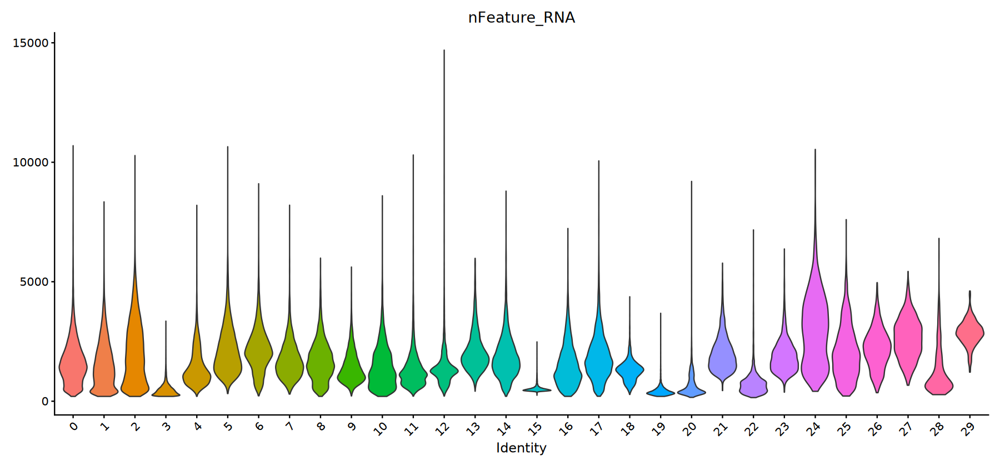

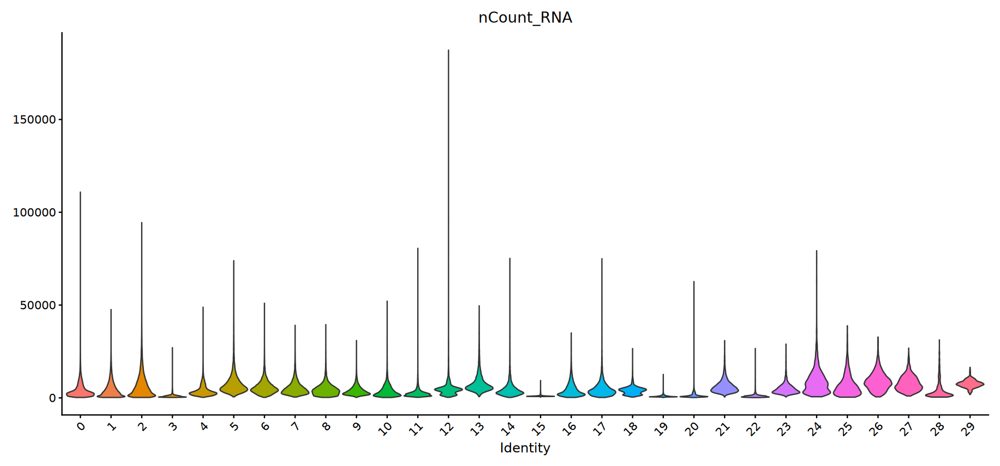

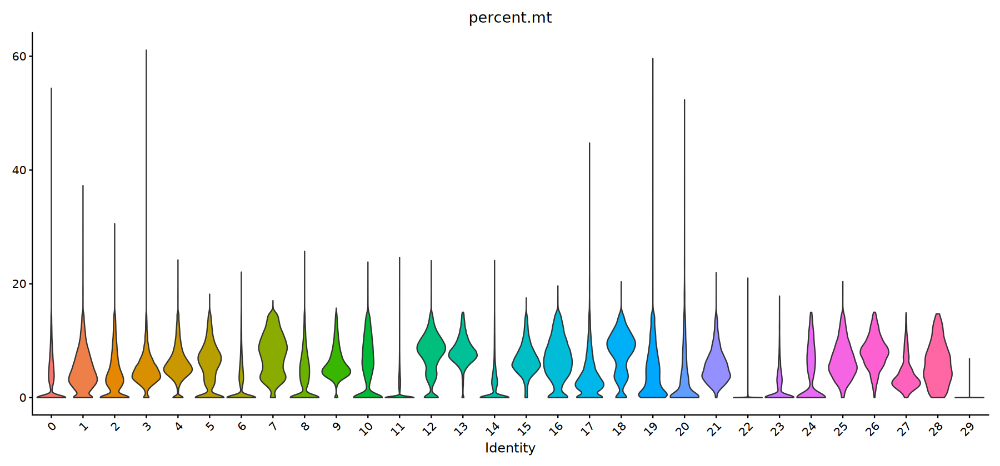

In [111]:
data_merged_mesen@active.ident <- factor(data_merged_mesen$`RNA_snn_res.0.5`)
options(repr.plot.width=15, repr.plot.height=7)
VlnPlot(data_merged_mesen, features = "nFeature_RNA", pt.size = 0) + NoLegend()
options(repr.plot.width=15, repr.plot.height=7)
VlnPlot(data_merged_mesen, features = "nCount_RNA", pt.size = 0) + NoLegend()
options(repr.plot.width=15, repr.plot.height=7)
VlnPlot(data_merged_mesen, features = "percent.mt", pt.size = 0) + NoLegend()

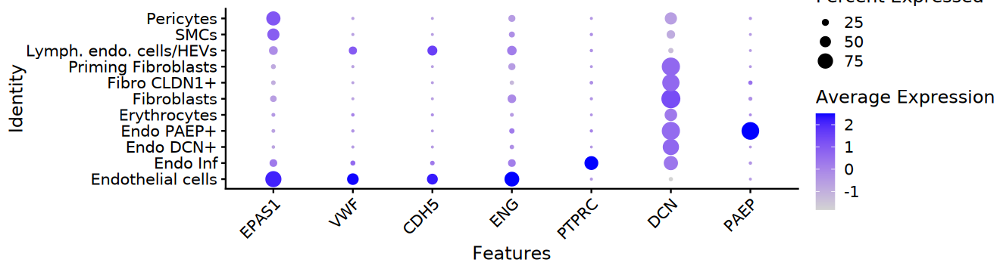

In [10]:
#Dotplotting
data_merged_mesen@active.ident <- factor(data_merged_mesen$cells)
data_merged_mesen$cells <- factor(data_merged_mesen$cells, levels = c( "Endothelial cells", "Endo Inf", "Endo DCN+", "Endo PAEP+", "Erythrocytes",
                                                            "Fibroblasts", "Fibro CLDN1+","Priming Fibroblasts", "Lymph. endo. cells/HEVs"
                                                           , "SMCs", "Pericytes"))
data_merged_mesen@active.ident <- data_merged_mesen$cells

features <- c( "EPAS1", "VWF", "CDH5", "ENG", "PTPRC", "DCN", "PAEP"
             ) 
options(repr.plot.width=11, repr.plot.height=3)
DotPlot(data_merged_mesen, features = features, group.by = "cells") + RotatedAxis()

In [2]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Integration_mesen")
load("data_merged_mesen_ann.RData")

In [26]:
#This notebook ends here and further subsetting and annotation of this dataset is in part 2